## Grounding Cookbook with Seed1.8

Visual grounding is a fundamental capability that underpins image perception and reasoning. The **Seed1.8** offers accurate and versatile object grounding abilities.

For object localization, we primarily use two common representations: **bounding boxes** (`<bbox>x1 y1 x2 y2</bbox>`) and **center points** (`<point>x y</point>`). We also support text spotting with **polygons** (`<polygon>x1 y1, x2 y2, x3 y3, x4 y4</polygon>`). All coordinates are in a **relative format**, normalized to a range of `0–999`. Therefore, after obtaining the model outputs, we need to further scale the coordinates according to the image's width and height to obtain the absolute position coordinates.

Currently, Seed1.8 supports following capabilities:

* Phrase Grounding
* Multi-object Grounding
* Generic Object Detection
* Open-ended Object Detection
* Object Detection with Visual Prompts
* Counting
* TextSpotting



### 0. Set Up Vision/Inference Dependencies
Set up vision/inference dependencies and define supervision-based annotators plus a helper to draw boxes, points, and labels on images (optionally saving results) for grounding visualization.

In [ ]:
pip install -r ../requirements.txt

In [1]:
# Copyright (c) 2025 Bytedance Ltd. and/or its affiliates
# SPDX-License-Identifier: Apache-2.0
from typing import List, Union, Optional
import os
import re
import json
import base64

import cv2
import numpy as np
from PIL import Image
import supervision as sv
from openai import OpenAI
import matplotlib.pyplot as plt

In [2]:
# visualization toos based on supervision
BOUNDING_BOX_ANNOTATOR = sv.BoxAnnotator(thickness=2)

class LabelAnnotator(sv.LabelAnnotator):

    @staticmethod
    def resolve_text_background_xyxy(
        center_coordinates,
        text_wh,
        position,
    ):
        center_x, center_y = center_coordinates
        text_w, text_h = text_wh
        return center_x, center_y, center_x + text_w, center_y + text_h


LABEL_ANNOTATOR = LabelAnnotator(text_padding=4,
                                 text_scale=0.5,
                                 text_thickness=1)


POINT_ANNOTATOR = sv.DotAnnotator(radius=10)

def draw_boxes_points_with_labels(
    image_path,
    boxes=None,
    points=None,
    classes=None,
    output_path=None,
):
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    if boxes is not None:
        detections = sv.Detections(
            xyxy=boxes,
            class_id=np.arange(len(boxes)),
            confidence=np.ones(len(boxes))
        )
        num_dets = len(boxes)
        annotated_image = BOUNDING_BOX_ANNOTATOR.annotate(
            image, detections)
    if points is not None:
        points = np.concatenate([points, points], axis=1)
        detections = sv.Detections(
            xyxy=points,
            class_id=np.arange(len(points)),
            confidence=np.ones(len(points))
        )
        num_dets = len(points)
        annotated_image = POINT_ANNOTATOR.annotate(
            image, detections,
        )
    if classes is not None:
        annotated_image = LABEL_ANNOTATOR.annotate(
            annotated_image, detections, labels=classes
        )

    if output_path:
        cv2.imwrite(
            output_path,
            cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR)
        )
    
    return annotated_image

### 1. Set Up Prerequisites
- **API Key**: [Obtain an API key](https://console.volcengine.com/ark/region:ark+cn-beijing/apiKey) for the Seed-1.8 model.
- **Model Endpoint**: Ensure the base URL of the Ark API.
- **Activate the Model**: Activate the Seed-1.8 model in [the Ark Console](https://console.volcengine.com/ark/region:ark+cn-beijing/openManagement).

In [ ]:
# Please set the API key here
os.environ['ARK_API_KEY']  = 'your_ark_api_key'
model_endpoint = "your_ark_endpoint"

In [41]:
client = OpenAI(
    base_url="https://ark.cn-beijing.volces.com/api/v3",
    api_key=os.environ.get("ARK_API_KEY"),
    default_headers={"ark-beta-image-process": "true"}
)

### 2. Image preprocessing & inference

In [4]:
# encode image into base64 encoding
def encode_image(image_path):
    with open(image_path, "rb") as image_file:
        image = base64.b64encode(image_file.read()).decode('utf-8')
    return image

In [5]:
def inference_image(prompt, image_path, reasoning_effort="medium"):
    base64_image = encode_image(image_path)
    image_format = image_path.split('.')[-1]
    assert image_format in ['jpg', 'jpeg', 'png', 'webp']
    
    response = client.chat.completions.create(
        model=model_endpoint,
        messages=[
            {
                "role": "user",
                "content": [
                    {
                        "type": "image_url",
                        "image_url": {
                            "url": f"data:image/{image_format};base64,{base64_image}"
                        },
                    },
                    {"type": "text", "text": prompt},
                ],
            }
        ],
        reasoning_effort=reasoning_effort
    )
    return response.choices[0]

## 1. Phrase Grounding
Localizing specific objects or region in an image based on a natural language phrase. Notably Seed1.8 can handle highly complex, reasoning-intensive phrase grounding tasks.

In [52]:
image_path = "samples/hat.jpg"
text_prompts = "Output the bounding boxes of all people wearing hat, excluding yellow hat, the bounding box format is <bbox>x1 y1 x2 y2</bbox>."

In [53]:
result = inference_image(text_prompts, image_path)
print("Seed1.8:", result.message.content)

Seed1.8: Let's list all people wearing hats *excluding the yellow hat wearer*:

1.  <bbox>0 298 173 640</bbox> (red baseball-style hat)
2.  <bbox>128 223 300 644</bbox> (blue/white woven patterned hat)
3.  <bbox>178 421 434 988</bbox> (solid pink woven hat)
4.  <bbox>290 207 468 576</bbox> (light blue woven patterned hat)
5.  <bbox>378 322 667 936</bbox> (light tan woven hat)
6.  <bbox>421 178 529 425</bbox> (green woven patterned hat)
7.  <bbox>531 197 662 597</bbox> (solid bright blue woven hat)
8.  <bbox>601 282 843 781</bbox> (purple woven patterned hat)
9.  <bbox>731 108 951 604</bbox> (solid bright green woven hat)
10. <bbox>759 0 871 263</bbox> (grey baseball cap)


In [9]:
def parse_transform_bboxes_vanilla(image_path, message):
    
    pattern = r'<bbox>(\d+(?:\.\d+)?)\s+(\d+(?:\.\d+)?)\s+(\d+(?:\.\d+)?)\s+(\d+(?:\.\d+)?)</bbox>'
    matches = re.finditer(pattern, message)
    
    bboxes = [
        [float(match.group(1)), float(match.group(2)), 
         float(match.group(3)), float(match.group(4))]
        for match in matches
    ]
    image = Image.open(image_path)
    w, h = image.size
    # normalize the bbox to [0, 1]
    bboxes = np.array(bboxes, dtype='float') / 1000
    bboxes[:, 0::2] *= w
    bboxes[:, 1::2] *= h
    return bboxes

def parse_transform_points_vanilla(image_path, message):
    
    pattern = r'<point>(\d+(?:\.\d+)?)\s+(\d+(?:\.\d+)?)</point>'
    matches = re.finditer(pattern, message)
    
    points = [
        [float(match.group(1)), float(match.group(2))]
        for match in matches
    ]
    image = Image.open(image_path)
    w, h = image.size
    # normalize the bbox to [0, 1]
    points = np.array(points, dtype='float') / 1000
    points[:, 0] *= w
    points[:, 1] *= h
    return points

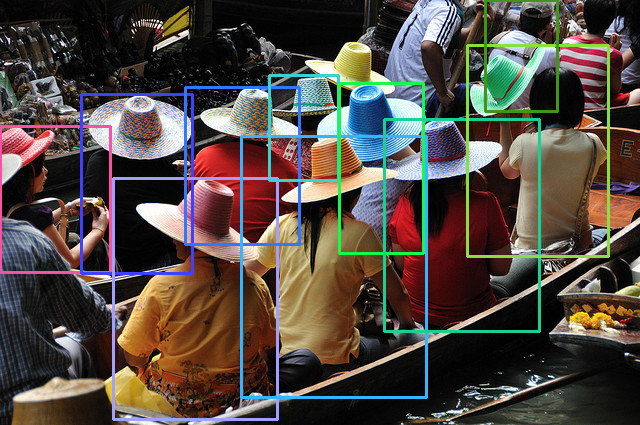

In [54]:
bboxes = parse_transform_bboxes_vanilla(image_path, result.message.content)
image = draw_boxes_points_with_labels(image_path, boxes=bboxes)
Image.fromarray(image)

Predict with points `<point>x y</point>`

In [15]:
image_path = "samples/rose.jpeg"
text_prompts = "Output the points (<point>x y</point>) for 'the white rose'."

In [16]:
result = inference_image(text_prompts, image_path)
print("Seed1.8:", result.message.content)

Seed1.8: Here are all the white rose positions in the image:
1.  <point>13 120</point>
2.  <point>13 370</point>
3.  <point>15 900</point>
4.  <point>72 672</point>
5.  <point>132 152</point>
6.  <point>150 925</point>
7.  <point>170 480</point>
8.  <point>185 22</point>
9.  <point>203 652</point>
10. <point>327 242</point>
11. <point>330 965</point>
12. <point>362 718</point>
13. <point>407 392</point>
14. <point>510 972</point>
15. <point>517 22</point>
16. <point>532 662</point>
17. <point>570 447</point>
18. <point>592 152</point>
19. <point>667 932</point>
20. <point>707 607</point>
21. <point>777 162</point>
22. <point>790 22</point>
23. <point>802 322</point>
24. <point>812 832</point>
25. <point>902 732</point>
26. <point>937 412</point>
27. <point>977 132</point>
28. <point>982 562</point>
29. <point>987 977</point>
30. <point>992 342</point>


In [17]:
points = parse_transform_points_vanilla(image_path, result.message.content)

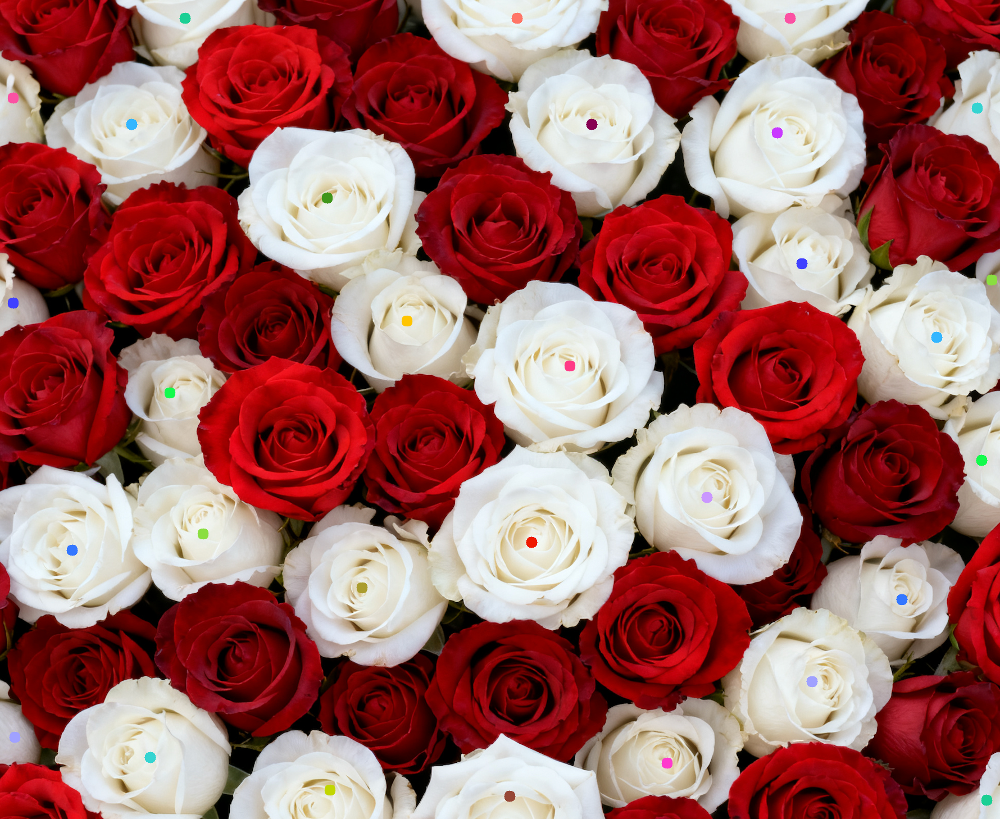

In [18]:
image = draw_boxes_points_with_labels(image_path, points=points)
Image.fromarray(image)

## 2. Generic / Open-Vocabulary Object Detection

Seed1.8 supports both conventional object detection and open-vocabulary object detection. Users only need to provide the target categories (a list), and Seed1.8 will directly locate the corresponding object in the image and output its coordinates accordingly.

In [45]:
image_path = "samples/dinner.png"
target_categories = "plate, goblet, cup, table"
text_prompts = f"Please detect all '{target_categories}' in the image."
text_prompts += """
For each object, provide its category and bounding box in the format: <bbox>x1 y1 x2 y2</bbox>.
Please output all objects in the JSON format: [{"category1": "<bbox1>"}, {"category2": "<bbox2>"}]
"""
result = inference_image(text_prompts, image_path)
print("Seed1.8:", result.message.content)

Seed1.8: [
{"large dinner plate (left)": "<bbox>207 420 460 607</bbox>"},
{"red wine goblet": "<bbox>239 333 328 668</bbox>"},
{"empty white wine goblet": "<bbox>182 372 231 730</bbox>"},
{"white coffee cup": "<bbox>287 548 445 805</bbox>"},
{"cup saucer": "<bbox>273 705 376 838</bbox>"},
{"large dinner plate (right)": "<bbox>562 625 962 928</bbox>"},
{"small red plate": "<bbox>222 908 472 998</bbox>"},
{"front water goblet": "<bbox>369 588 547 998</bbox>"},
{"middle water goblet": "<bbox>434 488 549 935</bbox>"},
{"upper water goblet": "<bbox>476 358 567 768</bbox>"},
{"small right red wine goblet": "<bbox>589 828 762 998</bbox>"},
{"small right white cup": "<bbox>542 828 722 998</bbox>"},
{"main dining table": "<bbox>185 498 992 998</bbox>"},
{"background right table": "<bbox>699 93 912 510</bbox>"},
{"background left table": "<bbox>106 35 234 270</bbox>"}
]


In [35]:
def parse_transform_bboxes_json(image_path, message):
    pattern = r'<bbox>(\d+(?:\.\d+)?)\s+(\d+(?:\.\d+)?)\s+(\d+(?:\.\d+)?)\s+(\d+(?:\.\d+)?)</bbox>'
    items = json.loads(message)
    bboxes = []
    categories = []
    for item in items:
        try:
            cat, bbox_str = tuple(item.items())[0]
            bbox = re.match(pattern, bbox_str)
            bbox = [float(bbox.group(i + 1)) for i in range(4)]
            bboxes.append(bbox)
            categories.append(cat)
        except Exception as e:
            print("error parsing: {}, error: {}".format(item, e))
    image = Image.open(image_path)
    w, h = image.size
    # normalize the bbox to [0, 1]
    bboxes = np.array(bboxes, dtype='float') / 1000
    bboxes[:, 0::2] *= w
    bboxes[:, 1::2] *= h
    return bboxes, categories

In [46]:
bboxes, categories = parse_transform_bboxes_json(image_path, result.message.content)

In [47]:
image = draw_boxes_points_with_labels(image_path, boxes=bboxes, classes=categories)

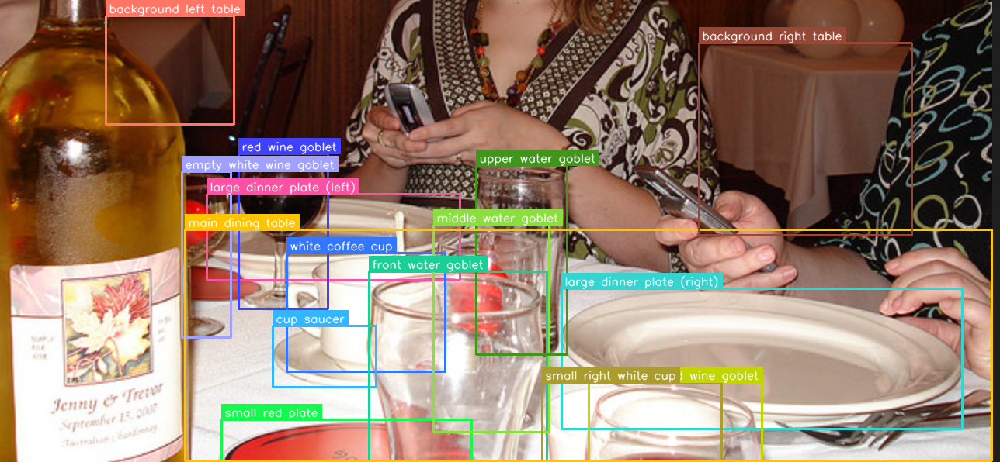

In [48]:
Image.fromarray(image)

## 3. Open-Ended Object Detection
Interestingly, the Seed1.8 supports **open-ended object detection**! Traditional detection models or open-vocabulary detection models typically rely on a *predefined vocabulary* to classify objects. In contrast, Seed1.8 does not depend on any vocabulary, enabling truly open-ended object detection. It can directly predict the categories and bounding boxes of objects present in an image — a milestone advancement in the field.

In [49]:
image_path = "samples/room3.jpg"
text_prompts = """
Please detect and list all objects in the image in detail, output the fine-grained category such as 'person','pizza' and bounding box for each object.
Please output all objects in the JSON format: [{"category1": "<bbox1>"}, {"category2": "<bbox2>"}]
"""
result = inference_image(text_prompts, image_path)
print("Seed1.8:", result.message.content)

Seed1.8: [
{"wooden open storage chest": "<bbox>17 487 178 678</bbox>"},
{"small wooden spice rack": "<bbox>70 653 129 730</bbox>"},
{"round green ceramic bowl": "<bbox>165 651 228 715</bbox>"},
{"plate with eggs and sliced sausage": "<bbox>139 711 265 778</bbox>"},
{"plate with sliced cured meat": "<bbox>159 774 300 845</bbox>"},
{"plate with bread rolls": "<bbox>306 780 479 876</bbox>"},
{"small plate with cheese slice": "<bbox>331 707 445 767</bbox>"},
{"white porcelain butter dish": "<bbox>284 655 373 736</bbox>"},
{"large white ceramic canister": "<bbox>260 586 320 674</bbox>"},
{"brown/white ceramic crock": "<bbox>232 573 279 655</bbox>"},
{"metal conical funnel": "<bbox>350 577 398 642</bbox>"},
{"set of metal knives": "<bbox>410 651 528 690</bbox>"},
{"pair of wooden rolling pins": "<bbox>487 730 678 790</bbox>"},
{"hanging cured pork ham": "<bbox>860 330 925 632</bbox>"},
{"industrial cast iron range oven": "<bbox>550 326 832 767</bbox>"},
{"main wooden worktable": "<bbox>0 54

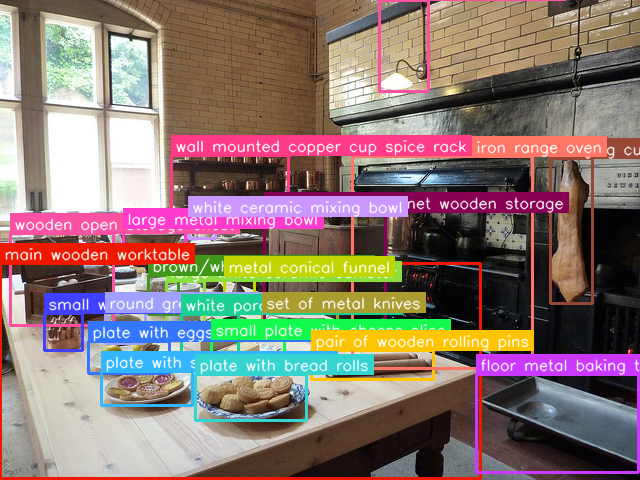

In [50]:
bboxes, classes = parse_transform_bboxes_json(image_path, result.message.content)
image = draw_boxes_points_with_labels(image_path, boxes=bboxes, classes=classes)
Image.fromarray(image)

## 4. Object Counting
Seed1.8 performs well in object counting, even in dense scenes, where it can still provide accurate counts. We offer two usage modes:
* Direct counting
* Chain-of-Thought (CoT) counting via points or bounding boxes, which is typically more accurate.

In [32]:
image_path = "samples/parking_lot.png"
text_prompts = "How many vehicles in this image? Please count the vehicles by pointing. Provide the points in the format <point>x y</point>"
result = inference_image(text_prompts, image_path)
print("Seed1.8:", result.message.content)

Seed1.8: Let's count all vehicles systematically:

### Leftmost Column
<point>10 860</point>, <point>67 108</point>, <point>67 158</point>, <point>67 208</point>, <point>67 258</point>, <point>67 308</point>, <point>67 358</point>, <point>67 408</point>, <point>70 456</point>, <point>70 504</point>, <point>70 552</point>, <point>70 604</point>, <point>70 652</point>, <point>70 702</point>, <point>70 752</point>, <point>70 852</point>, <point>70 902</point>
*(17 vehicles)*

---

### Second Column
<point>207 108</point>, <point>207 158</point>, <point>207 208</point>, <point>207 258</point>, <point>207 308</point>, <point>207 358</point>, <point>207 408</point>, <point>207 456</point>, <point>207 504</point>, <point>207 552</point>, <point>207 604</point>, <point>207 652</point>, <point>207 702</point>, <point>207 752</point>, <point>207 802</point>, <point>207 852</point>, <point>207 902</point>
*(17 vehicles)*

---

### Third Column
<point>353 108</point>, <point>353 208</point>, <poin

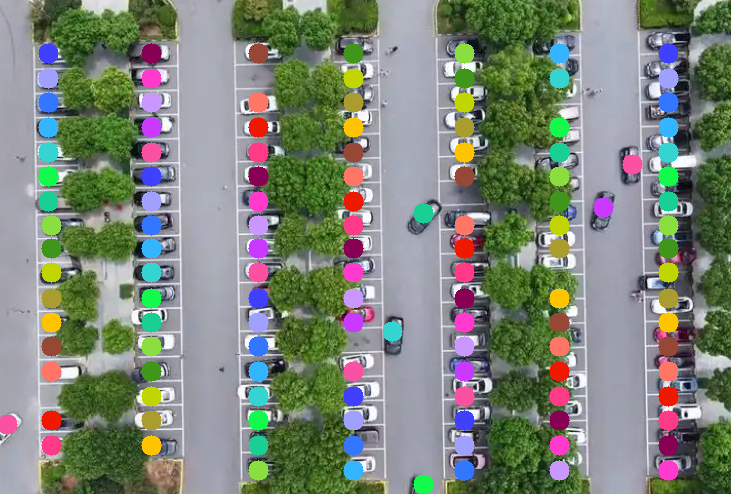

In [33]:
points = parse_transform_points_vanilla(image_path, result.message.content)
image = draw_boxes_points_with_labels(image_path, points=points)
Image.fromarray(image)

## 5. Grounding with Visual Prompts
With powerful in-context learning of vision-language models, Seed1.8 inherently support object localization using visual prompts. For example, inputting a exemplar image allows the Seed1.8 to accurately ground corresponding objects in other images, even without textual information like category or shape.

In [ ]:
def grounding_with_image_prompts(prompt, image1, image2):
    base64_image1 = encode_image(image1)
    image_format1 = image1.split('.')[-1]
    assert image_format1 in ['jpg', 'jpeg', 'png', 'webp']

    base64_image2 = encode_image(image2)
    image_format2 = image2.split('.')[-1]
    assert image_format2 in ['jpg', 'jpeg', 'png', 'webp']
    
    response = client.chat.completions.create(
    model=model_endpoint,
    messages=[
        {
            "role": "user",
            "content": [
                {
                    "type": "image_url",
                    "image_url": {
                        "url": f"data:image/{image_format1};base64,{base64_image1}"
                    },
                },
                {"type": "text", "text": prompt},
                {
                    "type": "image_url",
                    "image_url": {
                        "url": f"data:image/{image_format2};base64,{base64_image2}"
                    },
                },
            ],
        }
    ])
    return response.choices[0]

In [35]:
exemplar_image = "samples/exampler.png"
image_path = "samples/blueberry.png"

text_prompts = "Given the first image, please recognize the main object in the first image. Please detect all the similar objects in the second image. Please output all bounding boxes of the object in the second image with the format <bbox>x1 y1 x2 y2</bbox>" 
result = grounding_with_image_prompts(text_prompts, exemplar_image, image_path)
print("Seed1.8:", result.message.content)

Seed1.8: The main object in the first image is a **blueberry**. All blueberry bounding boxes in the second image are:

<bbox>227 394 305 471</bbox>
<bbox>250 502 316 568</bbox>
<bbox>260 338 323 402</bbox>
<bbox>271 552 344 627</bbox>
<bbox>285 438 356 509</bbox>
<bbox>307 613 374 685</bbox>
<bbox>309 379 364 444</bbox>
<bbox>312 312 364 364</bbox>
<bbox>320 497 378 567</bbox>
<bbox>338 262 397 324</bbox>
<bbox>340 321 407 385</bbox>
<bbox>350 574 412 634</bbox>
<bbox>359 448 422 513</bbox>
<bbox>363 377 427 448</bbox>
<bbox>373 636 441 707</bbox>
<bbox>374 515 442 578</bbox>
<bbox>390 289 442 349</bbox>
<bbox>393 216 459 289</bbox>
<bbox>398 355 426 387</bbox>
<bbox>412 413 466 474</bbox>
<bbox>414 589 471 651</bbox>
<bbox>421 467 482 529</bbox>
<bbox>428 363 484 422</bbox>
<bbox>432 666 500 736</bbox>
<bbox>433 318 484 369</bbox>
<bbox>433 536 474 595</bbox>
<bbox>457 249 517 315</bbox>
<bbox>463 426 524 487</bbox>
<bbox>498 649 561 714</bbox>
<bbox>559 661 627 731</bbox>


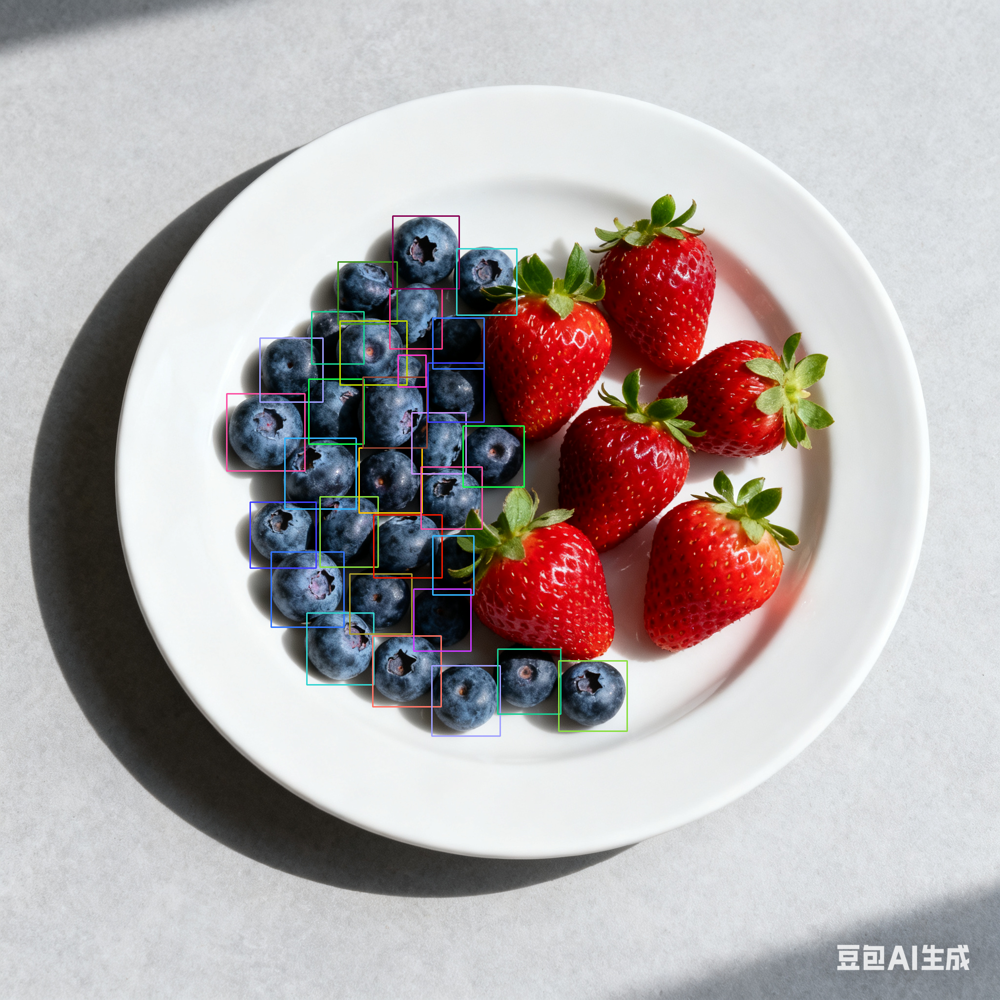

In [36]:
bboxes = parse_transform_bboxes_vanilla(image_path, result.message.content)
image = draw_boxes_points_with_labels(image_path, boxes=bboxes)
Image.fromarray(image)

## 6. TextSpotting


In addition to object detection within images, Seed1.8VL also supports text detection and recognition, as well as document layout analysis.

- **Text detection and text recognition**: Seed1.8VL supports detecting text within images and outputs the coordinates in a bbox format. The detected text is annotated as follows:
  ```html
  <text>text</text><bbox>x1 y1 x2 y2</bbox>
  ```

In [37]:
from PIL import ImageDraw
def simple_pil_visual(pilimg, boxes, texts):
    
    if texts is None or len(texts) == 0:
        texts = [''] * len(boxes)
        
    draw = ImageDraw.Draw(pilimg) 
    
    for idx, (box, text) in enumerate(zip(boxes, texts)):
        box = [(b[0], b[1]) for b in box]
        if text != '':
            draw.text([box[0][0], max(0, box[0][1])], text, 'red') 
        draw.rectangle(box, outline='red')
    return pilimg

def extract_spotting_box(text, image):
    boxes = re.findall(r'<bbox>(.*?)</bbox>', text)
    extract_boxes = []
    for box in boxes:
        box = [int(v) for v in box.split(' ') if v!='' or v!=' ']
        box = np.array(box).reshape([-1, 2])
        
        box = np.array(box) / 999 * np.array([image.width, image.height])
        extract_boxes.append(box)
    return extract_boxes

Seed1.8: ```
<text>Farm
Steady</text><bbox>524 178 592 256</bbox>

<text>Everything
Bagel
& Cream
Cheese</text><bbox>426 573 671 808</bbox>

<text>Making Kit</text><bbox>488 813 606 848</bbox>
```


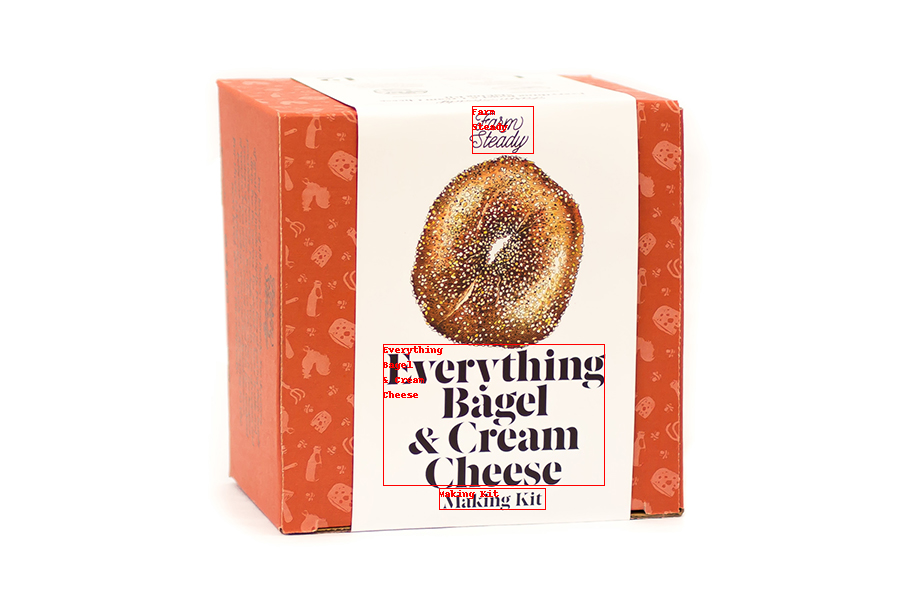

In [38]:
image_path = "samples/ocr.png"
text_prompts = "OCR with Grounding in the image in the format of <text>text</text><bbox>x1 y1 x2 y2</bbox>"
result = inference_image(text_prompts, image_path)
print("Seed1.8:", result.message.content)
boxes = extract_spotting_box(result.message.content, Image.open(image_path))
pattern = re.compile(r'<text>(.*?)</text>', re.DOTALL)
texts = re.findall(pattern, result.message.content)
vis_image = simple_pil_visual(Image.open(image_path), boxes, texts)
vis_image